In [2]:
import pandas as pd
import geopandas as gpd
from pathlib import Path
import matplotlib.pyplot as plt
from shapely import LineString

# Functions 

This section of the notebook contains all the functions necessary for running the analysis for this assignment. The functions can be divided into two sets. The first set of functions extracts and processes the necessary GTFS data from each city, and the second set analyzes and calculates statistics for the data as well as plots it. 

| Functions for extracting and preparing GTFS data. | Functions for analysis and plotting |
| --- | --- |
| `read_files` | `join_stops_grids` |
| `read_stops` | `process_stop_data` |
| `read_shapes` | `stop_density` |
| `create_route_linestrings` | `stop_departures` |
| `fetch_finland` | `rh_stats` |
| `create_grid` | `area_stats` |
| `weekday_calendar` | `plot_departures_regions` |
| `get_rushhour_departures` | `plot_departures_grid` |
| `load_geometries ` | `plot_rh_interactive` |
||`plot_density_grid`|
||`plot_data`|

## Preparing GTFS data

In [3]:
def read_files(directory: Path, city: str):
    """
    This function reads and returns necessary plain text files 
    from an already downloaded GTFS (General Transit Feed Specification) package.
    
    Parameters:
        directory = the path to the folder containing city-specific subfolders. 
        city = the name of the city and subfolder where the data should be extracted from
    
    Returns:
        stops = Stop location and attribute data
        shapes = Public transport network route geometries (as point-like nodes)
        stop_times = Arrivals and departures at each stop
        trips = Attributes of scheduled trips 
        calendar = Schedule and Service attributes according to days of the week
        calendar_dates = Dates and attributes of potential service exceptions 

    """

    folder_directory = directory / city
    stops = pd.read_csv(folder_directory / "stops.txt")
    # OMITTED *** shapes = pd.read_csv(folder_directory / "shapes.txt") 
    stop_times = pd.read_csv(folder_directory / "stop_times.txt")
    trips = pd.read_csv(folder_directory / "trips.txt")
    calendar = pd.read_csv(folder_directory / "calendar.txt")
    calendar_dates = pd.read_csv(folder_directory / "calendar_dates.txt")

    return stops, stop_times, trips, calendar, calendar_dates

In [4]:
def read_stops(stops: pd.DataFrame):
    """This function converts the plain text "stops.txt" file into a GeoDataFrame with point geometries."""
    stops_gdf = gpd.GeoDataFrame(stops, geometry=gpd.points_from_xy(stops.stop_lon, stops.stop_lat), crs = "EPSG:4326")

    return stops_gdf

The two functions below are used to generate route geometries for each public transport network. Unfortunately, since the route shape files are very large, and I did not end up using them for the analysis in this task, I decided to omit the `routes.txt` and `shapes.txt` files from this repository. I left the lines of code that refer to the generation of route geometries to show my work. Since GTFS data is openly available (at least HSL's data is very accessible) it can be downloaded locally to test out the functions. 

In [5]:
def create_route_linestring(group):
    """This function processes the grouped values in the "shapes.txt" file into LineString geometries."""
    points = list(zip(group["shape_pt_lon"], group["shape_pt_lat"]))
    return LineString(points)

In [6]:
def read_shapes(shapes: pd.DataFrame):
    """
    This function reads the "shapes.txt" file, groups them by route shape ID and turns 
    them into LineString geometries using the create_route_linestring function.
    """
    
    # Sort the point coordinates in the shapes-DataFrame by shape_ID and shape part sequence to create continuous LineStrings
    shapes = shapes.sort_values(by=["shape_id", "shape_pt_sequence"])

    # Each Shape ID corresponds with one route in the public transport network
    grouped_shapes = shapes.groupby("shape_id")
    route_shapes = grouped_shapes.apply(create_route_linestring, include_groups=False).reset_index()
    
    route_shapes.columns = ["shape_id", "geometry"]
    route_shapes = gpd.GeoDataFrame(route_shapes, geometry = "geometry", crs = "EPSG:4326")

    return route_shapes

In [7]:
def create_grid(area: gpd.GeoDataFrame, grid_size: int):
    """
    This function generates a grid with a given resolution that covers the area given.
    
    Parameters:
        area = the geographical service area of the public transport network
        grid_size = the resolution of the grid to be generated in square kilometers
    
    Returns:
        grid = grid with square cells the size of the grid_size variable in square kilometers
    """
    
    from shapely.geometry import Polygon
    import numpy as np
    from math import sqrt

    grid_size = sqrt(grid_size) * 1000 # grid_size is given in square km

    minx, miny, maxx, maxy = area.total_bounds

    grid_cells = []

    # create arrays of x- and y-coordinates along grid_size sized intervals 
    xcoords = np.arange(minx, maxx, grid_size)
    ycoords = np.arange(miny, maxy, grid_size)

    # create square geometries using the xcoords and ycoords arrays and determining other 
    # corners of the squares using the grid_size variable
    for x in xcoords:
        for y in ycoords:
            grid_cells.append(Polygon([(x,y), (x + grid_size, y), (x + grid_size, y + grid_size), (x, y + grid_size)]))
    
    grid = gpd.GeoDataFrame(grid_cells, columns=['geometry'], crs=area.crs) #convert list to GeoDataFrame

    grid = gpd.overlay(grid, area, how="intersection") # extract cells overlapping with public transport service area

    return grid

In [8]:
def weekday_calendar(calendar: pd.DataFrame, calendar_dates: pd.DataFrame): 
    """
    This function extracts the rows in the calendar DataFrame that represent public transport 
    service on weekdays and without exceptional removed service.
    
    Parameters: 
        calendar = DataFrame from the "calendar.txt" file
        calendar_dates = DataFrame with exception data from the "calendar_dates.txt" file 
    
    Returns:
        calendar = DataFrame with rows that do not have weekday service or include exceptional removal of service filtered out
    """
    
    # generate new series with values contianing a concatenated list of service days 
    calendar['weekdays'] = calendar.apply(lambda row: [row['monday'], row['tuesday'], row['wednesday'], row['thursday'], row['friday']], axis=1)
    
    
    # keep rows where any of the values in the calendar['weekdays'] series is 1
    calendar = calendar[calendar['weekdays'].apply(lambda x: any(i == 1 for i in x))]

    # if for some reason weekday service is incorrectly marked and not possible to extract, skip these rows with if-clause
    if not calendar.empty: 
        # merge calendar with calendar_dates to inspect exceptions to service
        calendar = calendar.merge(calendar_dates, on='service_id', how='left')

        # remove rows where exception_type == 2, "removed service" 
        calendar = calendar.loc[calendar['exception_type'] != 2]

    return calendar
    

In [9]:
def get_rushhour_departures(stop_times: pd.DataFrame, trips:pd.DataFrame, calendar:pd.DataFrame, calendar_dates:pd.DataFrame):

    """This function returns a DataFrame with departures from rush hours (7-9 am & 4-6 pm) and on weekdays."""

    import mapclassify

    # new series, 'hours', to avoid issues with inconsistent timestamp formats between GTFS datasets 
    stop_times['departure_time'] = stop_times['departure_time'].fillna('99:99') # stand-in NaN value
    stop_times['hours'] = stop_times['departure_time'].str.split(':').str[0].astype(int)

    # Helsinki-data uses a 27-hour system, including service from 1-3 am as part of the previous day's service. 
    stop_times.loc[stop_times['hours'] >= 24, 'hours'] = stop_times['hours'] - 24 

    # extract rows representing service during rush hours
    rush_hour_stop_times = stop_times.loc[((7 <= stop_times['hours']) & (stop_times['hours'] <= 9)) | ((16 <= stop_times['hours']) & (stop_times['hours'] <= 18))]

    # remove unnecessary columns
    columns = ['trip_id', 'departure_time', 'stop_id']
    rush_hour_stop_times = rush_hour_stop_times[columns]

    rush_hour_stop_times = rush_hour_stop_times.merge(trips, on="trip_id", how = "left")

    # extract service_id's for weekday service
    calendar_df = weekday_calendar(calendar, calendar_dates)

    if not calendar_df.empty:
        rush_hour_stop_times = rush_hour_stop_times.merge(calendar_df['service_id'], on='service_id', how='inner')
    
    # print notification if weekday filtering not possible
    else:
        print("\n***NOTE: Due to errors in the trip.txt file, it was not possible to filter trips by weekday service. \n***Including trips from all days of the week.\n")

    # group and count rush hour departures at each stop, create new series 
    departures_by_stop = rush_hour_stop_times.groupby('stop_id')['departure_time'].count()
    departures_by_stop.name = 'departure_count'

    classifier = mapclassify.Quantiles(departures_by_stop, k=5)

    departures_by_stop = departures_by_stop.to_frame()

    # classify the departure amounts into quantiles to standardize classification across cities 
    departures_by_stop['dept_ct_class'] = classifier.yb

    return departures_by_stop

In [10]:
def load_geometries(city: str, cities: list, directory: Path, grid_size: int):

    """
    This function processes the files and geometries for the public transport network of a given city. 

    Parameters:
        city = the name of the city whose data is to be processed 
        cities = the list of cities with available GTFS data
        directory = the path to the folder containing city-specific subfolders with GTFS data
        grid_size = the resolution in square kilometers of the grid to be generated over
                    the service area of the public transport network
    
    Returns:
        stops_gdf = GeoDataFrame containing all point-like stop geometries in the service area
        rh_stops_gdf = GeoDataFrame containing point-like stop geometries that have rush hour departures 
        *routes_gdf = GeoDataFrame containing LineString route geometries
        grid = grid generated over the service area with the given resolution
        area = regional division of the public transport service area

        *omitted for this submission

    """

    if city not in cities:
        print("The data for this city is currently unavailable.")
        return None, None, None, None
    else:
        # import and process necessary GTFS-files 
        stops, stop_times, trips, calendar, calendar_dates = read_files(directory, city)
        stops_gdf = read_stops(stops)
        print("Stop geometries have been loaded.")
        
        # OMITTED *** routes_gdf = read_shapes(shapes)
        # OMITTED *** print("Route geometries have been loaded.")
        
        # each city's area geometries are from different sources 
        if city == "Helsinki":
            area = gpd.read_file(directory / city / "hki_metro.gpkg")
            
        elif city == "Stockholm":
            area = gpd.read_file(directory / city / "east_central_sweden_districts.gpkg")
        
        elif city == "Copenhagen":
            area = gpd.read_file(directory / city / "cph_metro.gpkg")
        
        # convert CRS of stop and route geometries to match local area CRS and convert CRS to meters
        stops_gdf = stops_gdf.to_crs(area.crs)
        # OMITTED *** routes_gdf = routes_gdf.to_crs(area.crs)

        print("Stop, route and municipality geometries have loaded. Spatial join is being performed.")
        
        if city == "Copenhagen":
            # Copenhagen data includes stops for the whole country of Denmark. Include stops within the service area
            stops_gdf = gpd.sjoin(stops_gdf, area, how="inner", predicate="intersects").drop(columns=["index_right"])
            # OMITTED *** routes_gdf = gpd.sjoin(routes_gdf, area, how="inner", predicate="intersects").drop(columns=["index_right"])

        else:
            area = area[area.intersects(stops_gdf.union_all())]

        print("Joining stops and rush hour stop time data.")

        departures_by_stop = get_rushhour_departures(stop_times, trips, calendar, calendar_dates)
        rh_stops_gdf = stops_gdf.join(departures_by_stop, on='stop_id', how='inner') 

        print("Join complete. Grid is being created. This may take a moment depending on the grid resolution.")

        # dissolve regions and generate grid that covers entire area 
        grid = create_grid(area.dissolve().explode(), grid_size)
        grid = gpd.GeoDataFrame(geometry=grid.geometry)
        grid['grid_id'] = grid.index
        print("Grid created.") 
        
    return stops_gdf, rh_stops_gdf, grid, area

## Analysis and plotting

#### Calculating statistics and combining them into one large GeoDataFrame

In [11]:
def join_stops_grids(stops: gpd.GeoDataFrame, grid: gpd.GeoDataFrame): 
	"""This function performs a spatial join and copies the grid index of the cell each stop is located in."""
	stops = stops.sjoin(grid, how = "left", predicate = "within")
	return stops

In [12]:
def stop_departures(stops: gpd.GeoDataFrame):
    """This function calculates departure statistics for each grid cell."""
    
    import mapclassify 

    # calculate total sum of rush hour departures in each grid cell
    total_departures = stops.groupby('grid_id')['departure_count'].sum().reset_index()

    # calculate average rush hour departures per stop in each cell 
    avg_departures = stops.groupby('grid_id')['departure_count'].mean().reset_index()
    avg_departures.rename(columns={'departure_count': 'avg_departures'}, inplace=True)

    # join the sum and average statistics to one another 
    departure_df = total_departures.merge(avg_departures, on='grid_id', how='left')

    # classify the average departure data into quantiles 
    classifier = mapclassify.Quantiles(departure_df['avg_departures'], k=5)
    departure_df['avg_dept_class'] = classifier.yb
    departure_df['avg_dept_class'] += 1 # change scale to be 1-5 (instead of 0-4)
    
    return departure_df

In [13]:
def stop_density(stops: gpd.GeoDataFrame, grid: gpd.GeoDataFrame):
    """This function calculates the density of public transport stops in each grid cell"""
    
    import mapclassify 
    import numpy as np 
    
    # count stops in each grid cell
    stop_counts = stops.groupby('grid_id').size()
    grid["stop_count"] = grid.grid_id.map(stop_counts)
    grid["stop_count"] = grid["stop_count"].fillna(0).astype(int)

    # calculate area of each grid cell
    grid["area_km2"] = grid.geometry.area / 1_000_000

    # calculate density of stops in each grid cell
    grid["stop_density"] = grid["stop_count"] / grid["area_km2"]

    # classify stop density 
    classifier = mapclassify.UserDefined(y = grid["stop_density"], bins = [1, 2, 5, 10, 25, 50, 75, 100, np.inf])
    grid["stop_density_class"] = classifier.yb
    grid.loc[grid["stop_density"].isna(), 'stop_density_class'] = np.nan

    grid["stop_density"] = grid["stop_density"].fillna(0).astype(int)

    return grid

The `process_stop_data` returns `final_grid` which is what will be used for plotting. 

In [14]:
def process_stop_data(stops: gpd.GeoDataFrame, rh_stops: gpd.GeoDataFrame, grid: gpd.GeoDataFrame):
    """This function calculates stop density and rush hour departure statistics and returns a grid with all data."""

    joined = join_stops_grids(stops, grid)
    rh_joined = join_stops_grids(rh_stops, grid)

    stops_with_departures = stop_departures(rh_joined)

    grid_density = stop_density(joined, grid)

    final_grid = grid_density.merge(stops_with_departures, on='grid_id', how='left')

    final_grid['avg_dept_class'] = final_grid['avg_dept_class'].fillna(0)

    return final_grid

In [15]:
def rh_stats(final_grid: gpd.GeoDataFrame):
    """
    This function generates a DataFrame with values that describe the distribution
    of cells containing the highest quantile of rush hour departures.
    """
    top20_area = final_grid.loc[final_grid['avg_dept_class'] == 5].area.sum()
    top20_area /= 1_000_000

    total_area = final_grid.geometry.area.sum()
    total_area /= 1_000_000

    percent = top20_area / total_area

    stats_data = {
        "Metric": ["Top 20% Area (km²)", "Total Area (km²)", "Coverage of Level 5 areas (%)"],
        "Value": [f"{top20_area:.2f}", f"{total_area:.2f}", f"{percent:.2%}"]
    }
    stats_df = pd.DataFrame(stats_data)
    
    return stats_df

In [16]:
def area_stats(city, service_area, final_grid):
    """This function returns a dataframe with statistics describing the level of rush hour service in different administrative areas."""
    
    region_name = {'Helsinki': 'nimi', 'Stockholm': 'distriktsnamn', 'Copenhagen': 'kommunenavn'}
    regions_data = []
    
    for i, region in service_area.iterrows():
        geometry = region.geometry
        name = region[region_name[city]]
        area_km2 = geometry.area / 1_000_000

        region_cells = final_grid[final_grid.intersects(geometry)]
        intersected_cells = gpd.overlay(region_cells, service_area[service_area['geometry'] == geometry], how='intersection')

        region_avg_dept_class = intersected_cells['avg_dept_class'].mean()

        top20_dept = intersected_cells[intersected_cells['avg_dept_class'] == 5]
        top20_dept_area = top20_dept.geometry.area.sum() / 1_000_000

        top20_dept_percent = top20_dept_area / area_km2 

        regions_data.append({'geometry': geometry, 'Name': name, 'Area km²': area_km2, 'top20_area': top20_dept_area, 'Avg Rush Hour Service Level': float(f"{region_avg_dept_class:.2f}"), 'Coverage of Level 5 areas (%)': float(f"{top20_dept_percent*100:.2f}")})
    
    regions_gdf = gpd.GeoDataFrame(regions_data, crs = service_area.crs)
    regions_gdf = regions_gdf.sort_values(by ='Coverage of Level 5 areas (%)', ascending=False)
    regions_gdf['id'] = regions_gdf.index

    return regions_gdf


The following functions are specifically for plotting and, when consolidated under one function (`plot_data`), allow for generating and saving multiple plots at a time. 

In [17]:
def plot_departures_grid(final_grid, directory, city):
    """This function plots the level of rush hour service with a grid covering the service area"""

    import contextily
    
    rh_stats_df = rh_stats(final_grid)

    average = f"{final_grid['avg_dept_class'].mean():.2f}"
    
    final_grid = final_grid.to_crs("EPSG:3857")
    minx, miny, maxx, maxy = final_grid.total_bounds

    width = maxx - minx
    height = maxy - miny

    base_height = 8  # Minimum height for smaller regions
    dynamic_height = min(20, base_height + (height / 100_000))  # Scale height dynamically
    fig_width = 15  # Fixed width for consistent table readability
    fig, ax = plt.subplots(figsize=(fig_width, dynamic_height + 2))

    final_grid.plot(column='avg_dept_class', ax=ax, alpha=.7)
    
    padding = 0.05  # Add 5% padding to the map
    ax.set_xlim([minx - width * padding, maxx + width * padding])
    ax.set_ylim([miny - height * padding, maxy + height * padding])
    
    ax.set_axis_off()
    ax.set_title(f"{city} - Public Transport Level of Scheduled Rush Hour Service", weight='bold', fontsize=15)

    ax.text(
        maxx, 
        miny + height * 0.05, 
        f"Total region average: {average}", 
        fontsize = 10, 
        horizontalalignment='right',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='black', boxstyle='round,pad=0.3')
    )
    
    cax = final_grid.plot(ax=ax, column='avg_dept_class',
                          cmap='viridis', alpha=0.75)

    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=1, vmax=5))
    sm.set_array([])
    
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.04)
    cbar.set_ticks([1, 2, 3, 4, 5])
    cbar.set_ticklabels(['1', '2', '3', '4', '5'])  # Rename the labels
    cbar.set_label("Average Departure Quantiles", fontsize=12)

    # table of administrative area statistics 
    table = ax.table(
        cellText=rh_stats_df.values,
        colLabels=rh_stats_df.columns,
        cellLoc="center",
        loc="bottom",
        bbox=[0, -0.25, 1, 0.15]
    )

    for key, cell in table.get_celld().items():
        cell.set_fontsize(12)
    
    # table title
    ax.text(
        0.5,  
        -0.06,  
        "Service area metrics", 
        ha='center',  
        va='center',  
        fontsize=15, 
        transform=ax.transAxes  
    )
    # attributions 
    if city == 'Helsinki': 
        atts = "GTFS Data 2024-2025 - Helsingin Seudun Liikenne (HSL/HRT), Municipalities - Statistics Finland"
    elif city == 'Stockholm':
        atts = "GTFS Data 2020 - Stockholms Lokaltrafik, Districts - Lantmäteriet"
    elif city == 'Copenhagen':
        atts = "GTFS Data 2024 - Rejseplanen, Municipalities - Plan- og Landdistriksstyrelsen"
    
    atts += ", Basemap - OpenStreetMap (c)"

    contextily.add_basemap(ax, source = contextily.providers.OpenStreetMap.Mapnik, attribution=(atts))

    plt.tight_layout()
    
    plt.savefig(directory / f"{city}_rh_departures_grid.png")
    
    plt.show()

In [18]:
def plot_departures_regions(regions_gdf, directory, city):
    """This function plots the level of rush hour service in the different administrative areas of a service area."""

    import contextily 
    
    regions_gdf = regions_gdf.to_crs("EPSG:3857")

    selected = regions_gdf[['Name', 'Avg Rush Hour Service Level', 'Coverage of Level 5 areas (%)']].head(3)

    average = f"{regions_gdf['Avg Rush Hour Service Level'].mean():.2f}"

    minx, miny, maxx, maxy = regions_gdf.total_bounds
    width = maxx - minx
    height = maxy - miny

    base_height = 8  # Minimum height for smaller regions
    dynamic_height = min(20, base_height + (height / 100_000))  # Scale height dynamically
    fig_width = 15  # Fixed width for consistent table readability
    fig, ax = plt.subplots(figsize=(fig_width, dynamic_height + 2))

    regions_gdf.plot(column='Avg Rush Hour Service Level', ax=ax, legend=True, cmap='viridis', edgecolor='black', linewidth=.5)   
    ax.set_axis_off()
    ax.set_title(f"Comparative rating of scheduled rush hour\n public transport service level in the {city} service area", weight='bold', fontsize=15)

    table = ax.table(
        cellText = selected.values,
        colLabels=selected.columns,
        cellLoc="center",
        loc="bottom",
        bbox=[0, -0.25, 1, 0.15]
    )

    for key, cell in table.get_celld().items():
        cell.set_fontsize(12)

    ax.text(
        0.5,  
        -0.06,  
        "Top 3 Regions Overview", 
        ha='center',  
        va='center',  
        fontsize=15, 
        transform=ax.transAxes  
    )

    # add average to map
    ax.text(
        maxx, 
        miny + height * 0.05, 
        f"Average of all areas: {average}", 
        fontsize = 13, 
        horizontalalignment='right',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='black', boxstyle='round,pad=0.3')
    )
    
    
    padding = 0.05  # Add 5% padding to the map
    ax.set_xlim([minx - width * padding, maxx + width * padding])
    ax.set_ylim([miny - height * padding, maxy + height * padding])

    # attributions 
    if city == 'Helsinki': 
        atts = "GTFS Data 2024-2025 - Helsingin Seudun Liikenne (HSL/HRT), Municipalities - Statistics Finland"
    elif city == 'Stockholm':
        atts = "GTFS Data 2020 - Stockholms Lokaltrafik, Districts - Lantmäteriet"
    elif city == 'Copenhagen':
        atts = "GTFS Data 2024 - Rejseplanen, Municipalities - Plan- og Landdistriksstyrelsen"
    
    atts += ", Basemap - OpenStreetMap (c)"

    contextily.add_basemap(ax, source = contextily.providers.OpenStreetMap.Mapnik, attribution=(atts))

    plt.tight_layout(rect=[0, 0.2, 1, 1])
    
    plt.savefig(directory / f"{city}_rh_departures_regions.png")
    
    plt.show()

In [19]:
def plot_density_grid(final_grid, directory, city):
    """This function plots the density of public transport stops in the service area."""

    import contextily
    
    final_grid = final_grid.to_crs("EPSG:3857")

    average = f"{final_grid['stop_density'].mean():.2f}"

    minx, miny, maxx, maxy = final_grid.total_bounds

    width = maxx - minx
    height = maxy - miny

    base_height = 8  # Minimum height for smaller regions
    dynamic_height = min(20, base_height + (height / 100_000))  # Scale height dynamically
    fig_width = 15  # Fixed width for consistent table readability
    fig, ax = plt.subplots(figsize=(fig_width, dynamic_height + 2))

    final_grid.plot(column='stop_density_class', ax=ax, alpha=.7)
    
    padding = 0.05  # Add 5% padding to the map
    ax.set_xlim([minx - width * padding, maxx + width * padding])
    ax.set_ylim([miny - height * padding, maxy + height * padding])
    
    ax.set_axis_off()
    ax.set_title(f"{city} - Density of public transport stops", weight='bold', fontsize=15)

    ax.text(
        maxx, 
        miny + height * 0.05, 
        f"Total region average: {average}", 
        fontsize = 10, 
        horizontalalignment='right',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='black', boxstyle='round,pad=0.3')
    )   
    
    cax = final_grid.plot(ax=ax, column='stop_density_class',
                          cmap='plasma', alpha=0.75)

    sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=1, vmax=9))
    sm.set_array([])
    
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.04)
    cbar.set_ticks([1, 2, 3, 4, 5, 6, 7, 8, 9])
    cbar.set_ticklabels(['≤1', '2', '5', '10', '25', '50', '75', '100', '>100'])  # Rename the labels
    cbar.set_label("Stop Density (stops/km²)", fontsize=12)

    # attributions 
    if city == 'Helsinki': 
        atts = "GTFS Data 2024-2025 - Helsingin Seudun Liikenne (HSL/HRT), Municipalities - Statistics Finland"
    elif city == 'Stockholm':
        atts = "GTFS Data 2020 - Stockholms Lokaltrafik, Districts - Lantmäteriet"
    elif city == 'Copenhagen':
        atts = "GTFS Data 2024 - Rejseplanen, Municipalities - Plan- og Landdistriksstyrelsen"
    
    atts += ", Basemap - OpenStreetMap (c)"

    contextily.add_basemap(ax, source = contextily.providers.OpenStreetMap.Mapnik, attribution=(atts))

    plt.tight_layout()
    
    plt.savefig(directory / f"{city}_stop_density_grid.png")
    
    plt.show()
    

In [20]:
def plot_rh_interactive(regions_gdf, directory, city):
    """This function plots an interactive map of the level of rush hour service in different administrative areas."""

    import folium 

    regions_gdf = regions_gdf.to_crs("EPSG:4326")

    minx, miny, maxx, maxy = regions_gdf.total_bounds
    center_lat = (miny+maxy) / 2
    center_lon = (minx+maxx) / 2

    #stylizing function for highlighting municipalities beneath the cursor using the tooltip
    def style_function(feature):
        return {
            "color": "transparent",
            "fillColor": "transparent"
        }
    
    #initialize interactive map
    interactive_map = folium.Map(location=(center_lat, center_lon), zoom_start=9)

    #show average rush hour service level of each municipality when the cursor hovers above it
    tooltip = folium.features.GeoJsonTooltip(
        fields=['Name', 'Avg Rush Hour Service Level'],
        aliases=['Name:', 'Rush Hour Service Level:']
    )

    #add the station_dist choropleth/raster to the map
    region_service_level = folium.Choropleth(
        geo_data = regions_gdf,
        data = regions_gdf,
        columns = ('id','Avg Rush Hour Service Level'),
        key_on = "feature.id",
        fill_opacity=0.7,
        fill_color="viridis",
        line_color="black",
        line_weight=0.5,
        legend_name=f"Comparative rating of scheduled rush hour public transport service level in the {city} service area",

        highlight=True
    )

    tooltip_layer = folium.features.GeoJson(
        regions_gdf,
        style_function=style_function,
        tooltip=tooltip
    )

    region_service_level.add_to(interactive_map)
    tooltip_layer.add_to(interactive_map)
    
    interactive_map.save(directory / f"{city}_rh_interactive_map.html")

In [1]:
def plot_data(cities_data: dict, city, directory):
    """
    This function processes the data extracted for each city, calculates
    stop density and rush hour departure statistics and plots the data.
    """
    stops = cities_data[city][0]
    rh_stops = cities_data[city][1]
    grid = cities_data[city][2]
    service_area = cities_data[city][3]

    final_grid = process_stop_data(stops, rh_stops, grid)
    regions_gdf = area_stats(city, service_area, final_grid)

    plot_density_grid(final_grid, directory, city)
    plot_departures_grid(final_grid, directory, city)
    plot_departures_regions(regions_gdf, directory, city)
    plot_rh_interactive(regions_gdf, directory, city)

# Extracting the data
The cell below is for extracting and preparing the GTFS data for each city. The data used in this assignment was retrieved from different sources. 

### Sources 

In the **Helsinki** metropolitan area, the local public transport authority Helsinki Region Transport (HSL) provides open access to their GTFS data on their own platform (https://www.hsl.fi/en/hsl/open-data). The municipal geometries are produced by Statistics Finland and access through a WFS interface. 

The **Stockholm** region GTFS data was retrieved from the Transit Feed Open mobility data platform. Transit feed is no longer in use and has been replaced by the Mobility Database catalog. However, the local transport authority SL (Stockholms Lokaltrafic) has not uploaded their GTFS data to the platform in an easily accessible way. For that reason, the data from Stockholm used in this analysis is from 2020. (https://transitfeeds.com/p/storstockholms-lokaltrafik/1086) 

The **Copenhagen** GTFS was retrieved using Rejseplanen Labs API (https://labs.rejseplanen.dk/hc/). I had to send a request to have an account made, so that I could access the data. The GTFS data is attached in the data folder in this repository. 

### Processed data

The result of this cell is a dictionary, `cities_data`, whose keys are city names with a list of dataframes as their values. In the next step, I will iterate over the keys and access their values using indices. Below is an example of the structure of the `cities_data` dictionary. 

{
    'Helsinki':
        [
            stops, rh_stops, routes, grid, service_area        ]
}

*The cell below prints out progress messages as it processes the data. Note that generating the grid may take a bit longer. Running the cell should take a few minutes.*

In [21]:
directory = Path().resolve() 
data_directory = directory
cities = ["Helsinki", "Stockholm", "Copenhagen"]

cities_data = {}

print("Input the resolution in km² of the grid to be generated.")
grid_size = int(input("Input the resolution for the grid to be generated (km²)"))
print(f"\nGrid resolution: {grid_size} km²")

for city in cities:
    print(f"\nProcessing data from {city}...")
    cities_data[city] = list(load_geometries(city, cities, data_directory, grid_size))
    print(f"\n{city} data processing complete.")
    
# [0] = stops, [1] = rh_stops, [2] = grid, [3] = service_area

Input the resolution in km² of the grid to be generated.

Grid resolution: 1 km²

Processing data from Helsinki...
Stop geometries have been loaded.
Stop, route and municipality geometries have loaded. Spatial join is being performed.
Joining stops and rush hour stop time data.
Join complete. Grid is being created. This may take a moment depending on the grid resolution.
Grid created.

Helsinki data processing complete.

Processing data from Stockholm...
Stop geometries have been loaded.
Stop, route and municipality geometries have loaded. Spatial join is being performed.
Joining stops and rush hour stop time data.

***NOTE: Due to errors in the trip.txt file, it was not possible to filter trips by weekday service. 
***Including trips from all days of the week.

Join complete. Grid is being created. This may take a moment depending on the grid resolution.
Grid created.

Stockholm data processing complete.

Processing data from Copenhagen...


C:\Users\lucas\AppData\Local\Temp\ipykernel_16876\1235477736.py:23: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  stop_times = pd.read_csv(folder_directory / "stop_times.txt")


Stop geometries have been loaded.
Stop, route and municipality geometries have loaded. Spatial join is being performed.
Joining stops and rush hour stop time data.
Join complete. Grid is being created. This may take a moment depending on the grid resolution.
Grid created.

Copenhagen data processing complete.


# Analysis and plotting
The cell below performs the analysis designed for this assignment, plots the resultiung data and saves the figures into a folder called "Final_items". 

In this task, I have designed two indicators that describe the nature and, potentially, the efficiency of public transport networks. The first indicator is public transport stop density and the second is rush hour service level. Both of these are calculated using grids of a resolution given in the previous phase. 

The resulting materials are:
- an interactive map depicting stop density in each city's public transport service area 
- a static map of rush hour service accompanied by a table describing the distribution of areas with frequent rush hour service 
- 

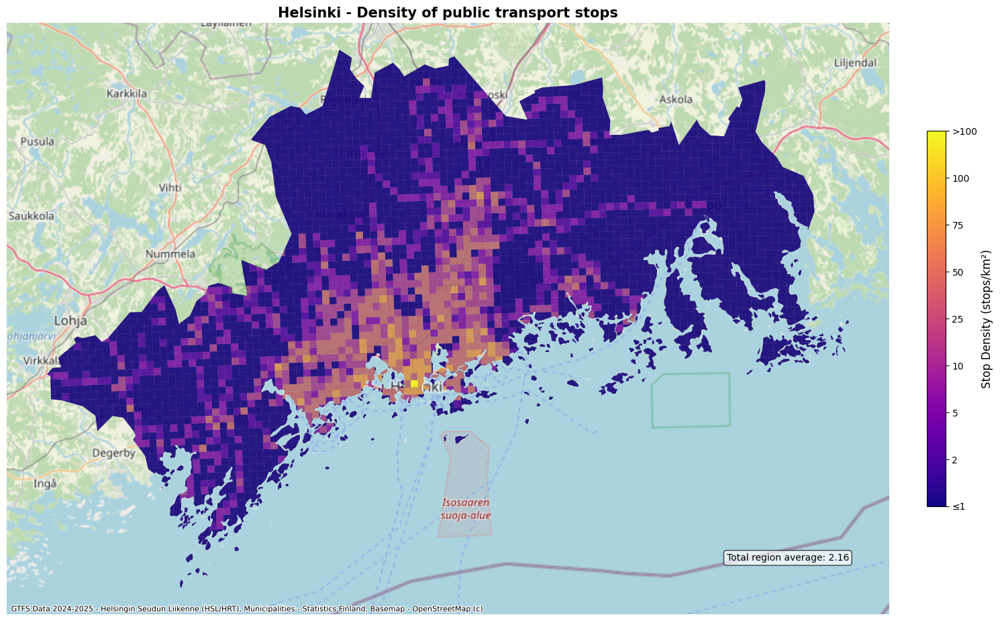

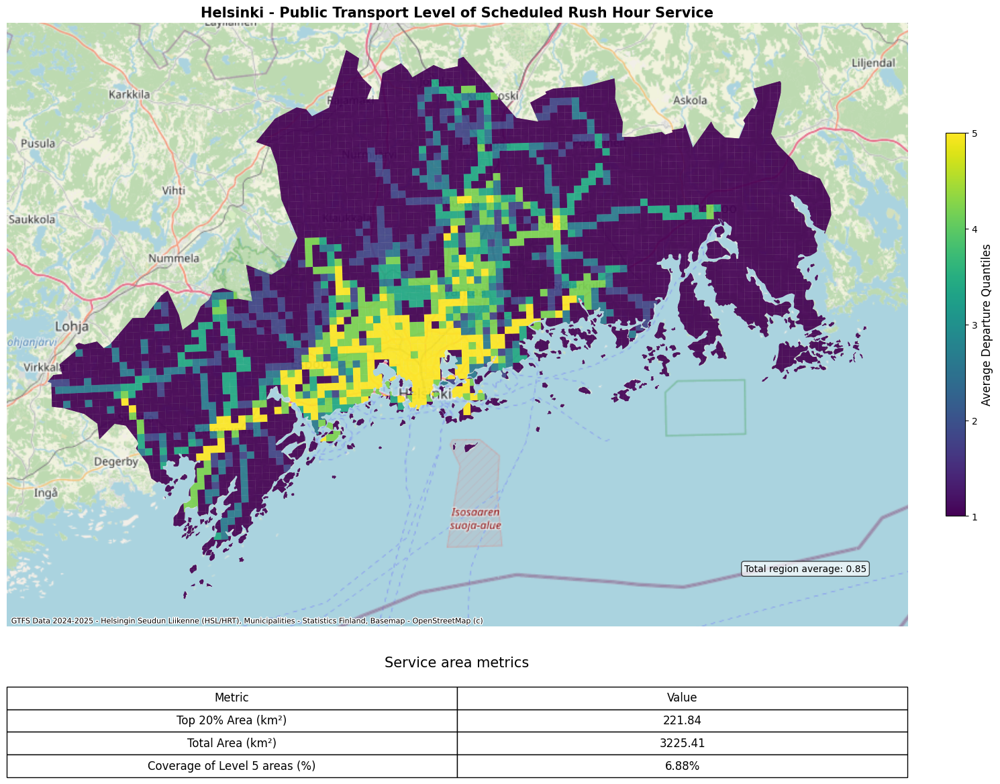

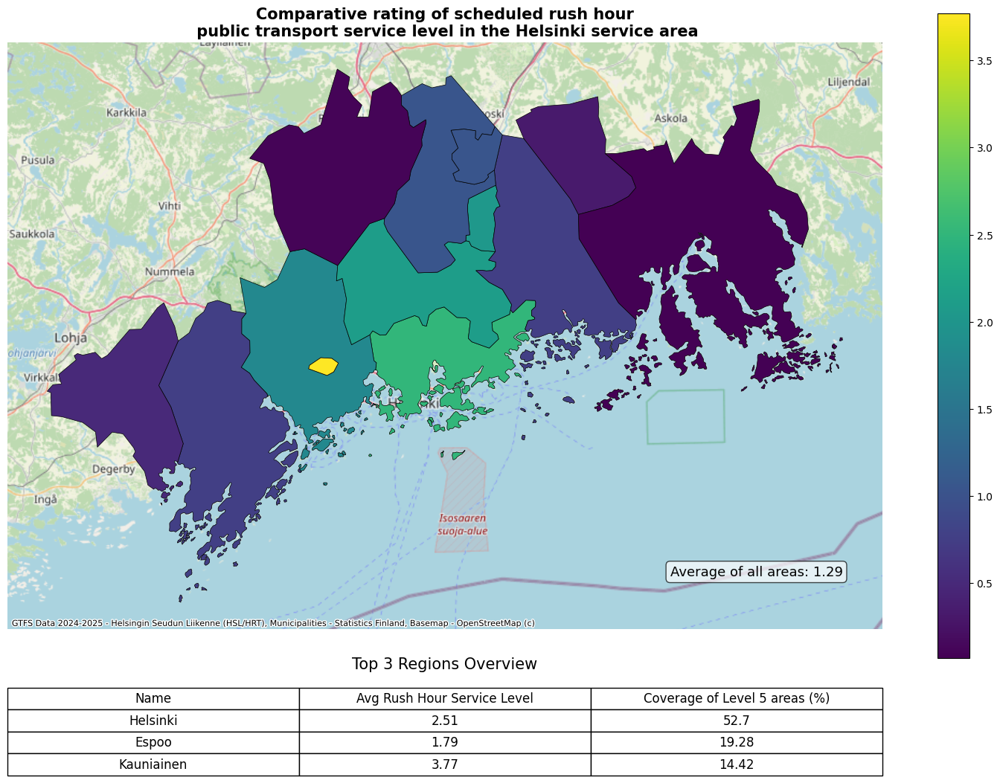

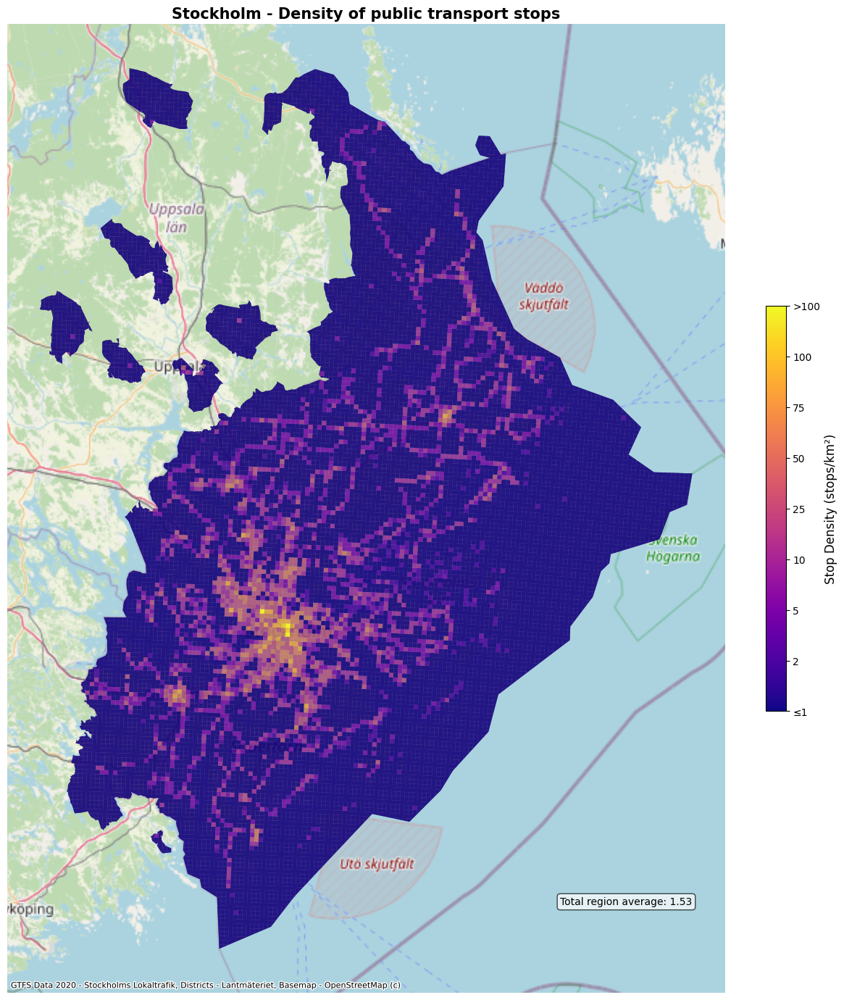

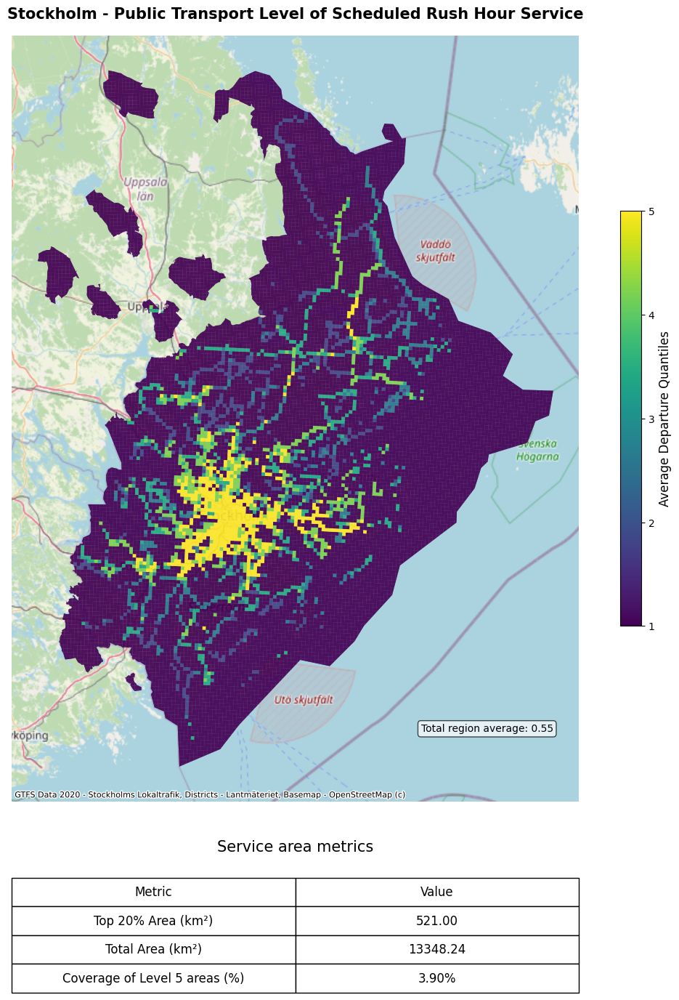

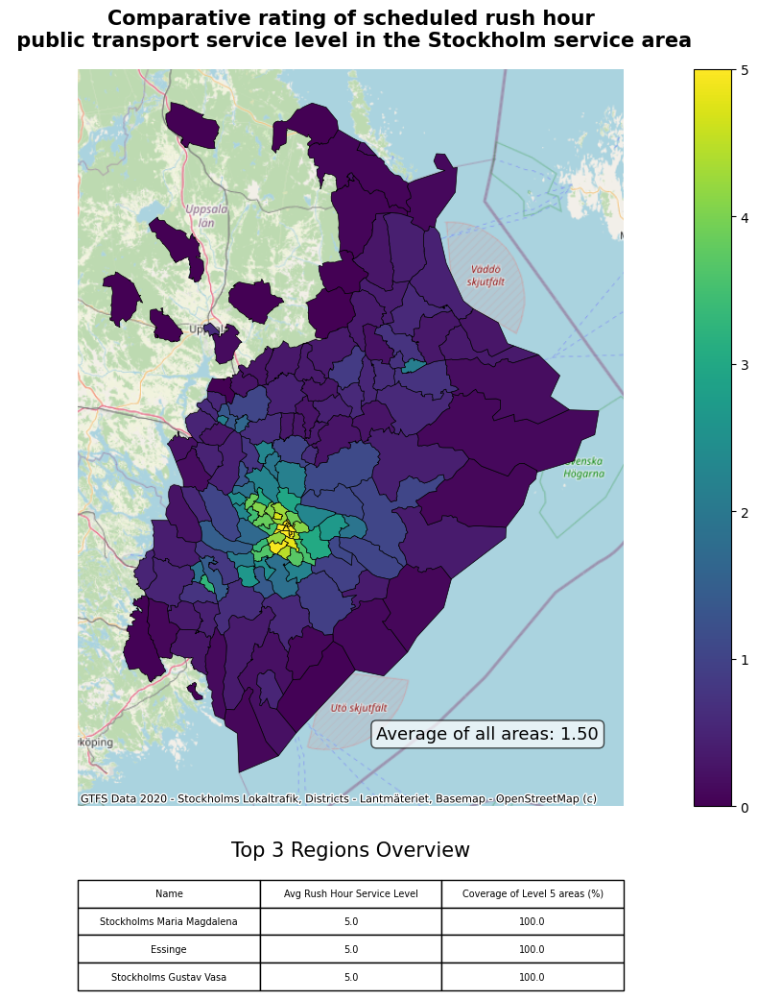

C:\Users\lucas\AppData\Local\Temp\ipykernel_16876\2659370041.py:13: UserWarning: `keep_geom_type=True` in overlay resulted in 1 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  intersected_cells = gpd.overlay(region_cells, service_area[service_area['geometry'] == geometry], how='intersection')


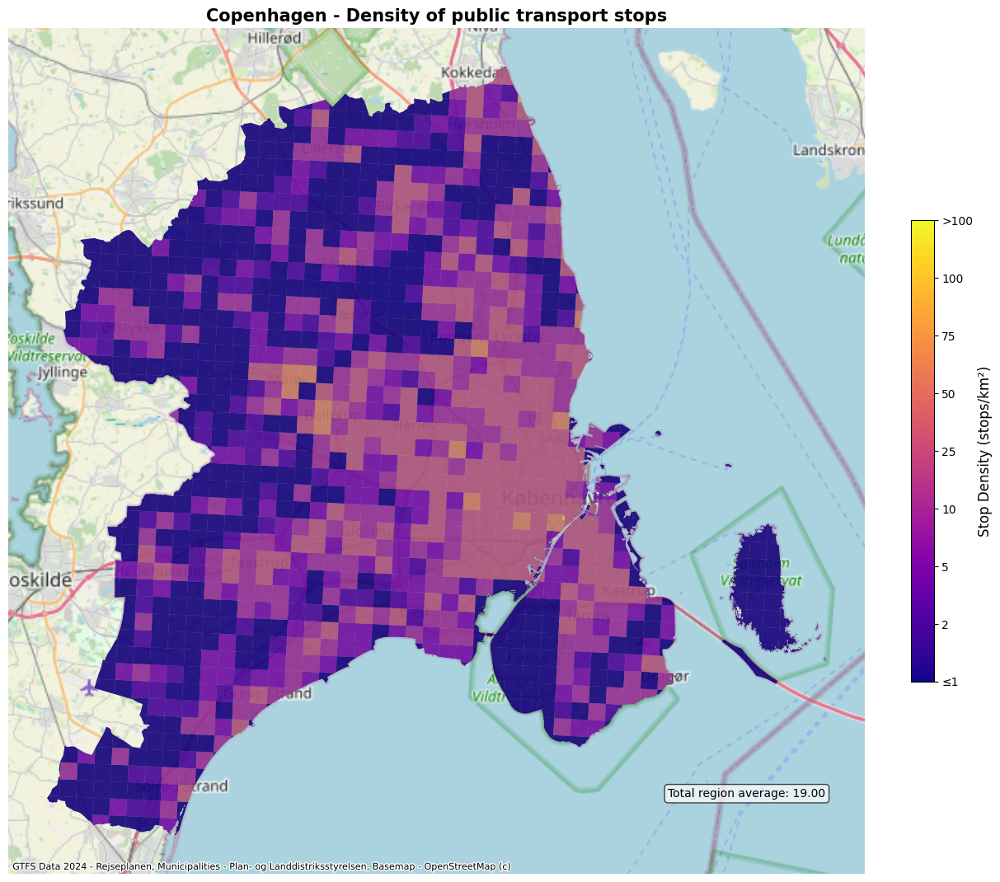

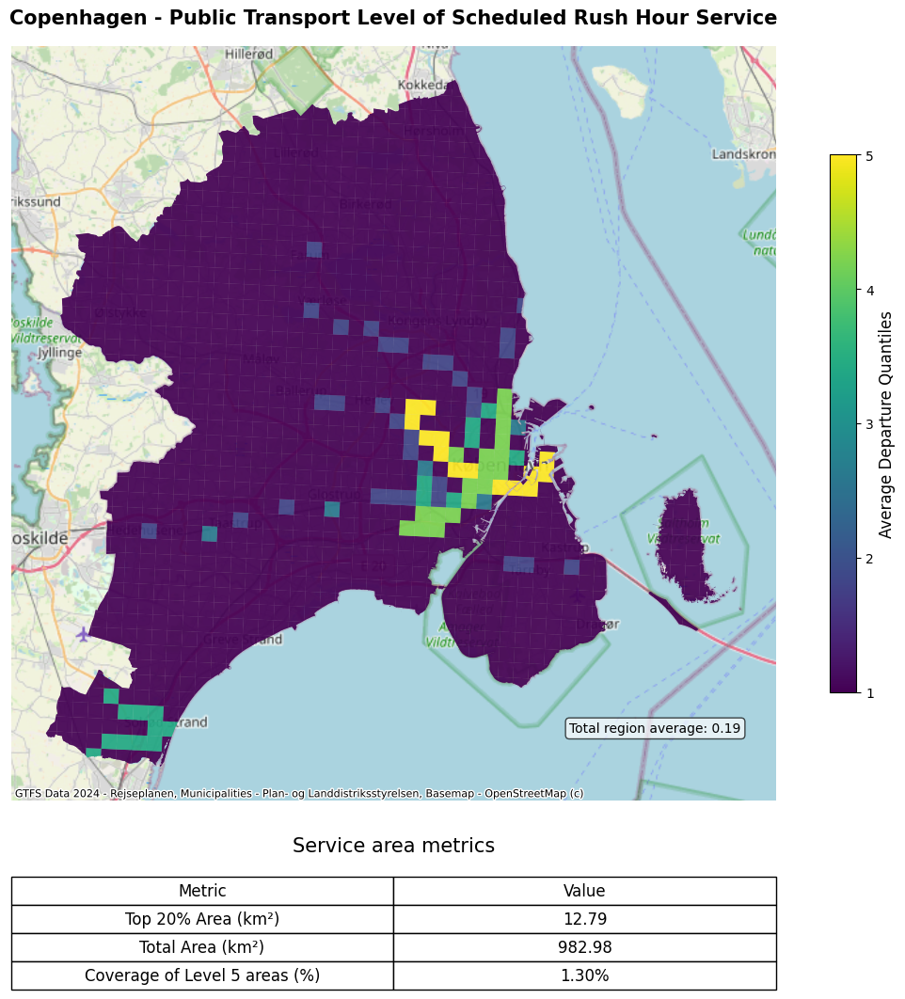

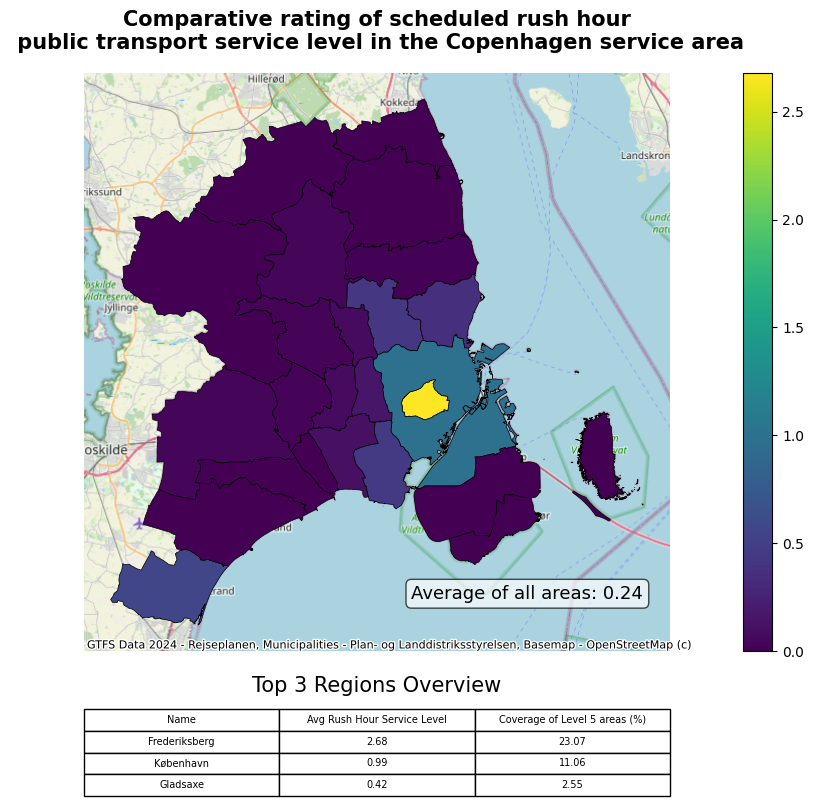

In [22]:
destination_directory = directory / "Final_materials"
destination_directory.mkdir(parents = True, exist_ok = True)
for city in cities: 
    plot_data(cities_data, city, destination_directory)